<a href="https://colab.research.google.com/github/iCarrrot/nn_sudoku_project/blob/master/DL_Project_Gdowski_Martusewicz.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End of term project for Deep Learning course, SS 2020 @ University of Wrocław
Authors:
* Piotr Gdowski
* Michał Martusewicz


## Main goal
Extend the handwritten digit-recognizing network to allow verifying sudoku's solution correctness

## Pipeline
* Collect a dataset of solved sudokus
* Cut out a grid from a picture
* Split grid into single digits
* Recognize handwritten digits
* Check if it is a valid solution (all digits in row/column/box are different)

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from tqdm.notebook import tqdm
import numpy as np
from skimage import io
from skimage.transform import rotate
from skimage.color import rgb2gray
from glob import glob
from skimage.filters import threshold_local
import numpy as np
import imutils
import cv2
from torch import nn
import itertools
import torch
import torchvision

%pylab inline


Populating the interactive namespace from numpy and matplotlib


### TODO


* dzielenie datasetu
* downsampling obrazków
* metoda szybko printująca obrazek
* wycinanie diagramu z modyfikowanym thresholdem
* spięcie całości w metodę
* cięcie diagramu
* import sieci do rozpoznawania liczb
* konsumpcja outputu sieci

* solver: https://towardsdatascience.com/solving-sudoku-with-convolution-neural-network-keras-655ba4be3b11 
* solving krok po kroku: RNN?
* jakies ładne ogarnięcie całości

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
pics_path = 'drive/My Drive/dataset/'
easy_pics_path = 'drive/My Drive/dataset/easy'

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
def to_gray(img_path):
    return np.asarray(Image.open(img_path).convert('L'))

gray_images = []
for dir_name in ['easy', 'medium', 'hard']:
    dir_path = os.path.join(pics_path, dir_name)
    for img_name in os.listdir(dir_path):
        img_path = os.path.join(pics_path, dir_name, img_name)
        gray_images.append(to_gray(img_path))

gray_images = np.array(gray_images)
gray_images.shape

(60, 4160, 3120)

## Dataset

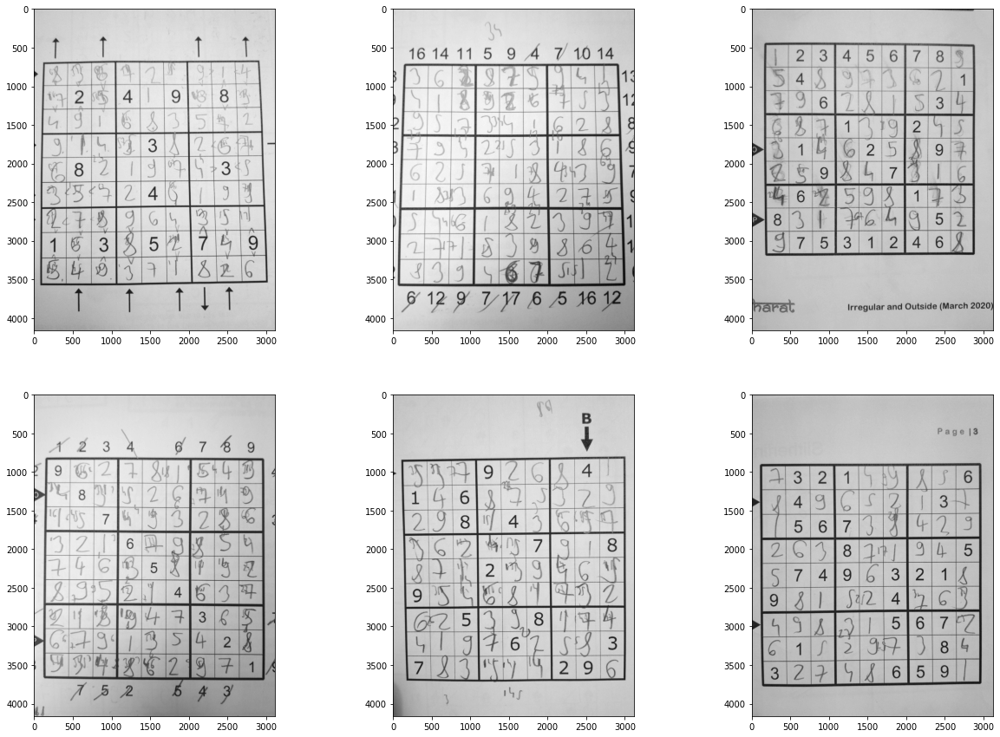

In [ ]:
plt.figure(figsize=(21, 15))
for idx, img in enumerate(gray_images[np.random.choice(gray_images.shape[0], size=6)]):
    plt.subplot(2, 3, idx + 1)
    imgplot = plt.imshow(img, cmap='gray')
plt.show()

## Checking solution correctness

Pipeline:
* take photo
* detect edges and crop the photo 
* divide grid into little squares and get prediction for each of them
* check cardinality of numbers for each row/column
* if an error found, mark it on the grid

Can we somehow detect the size of grid (so not only 9x9 could be checked, but also 2xN)?

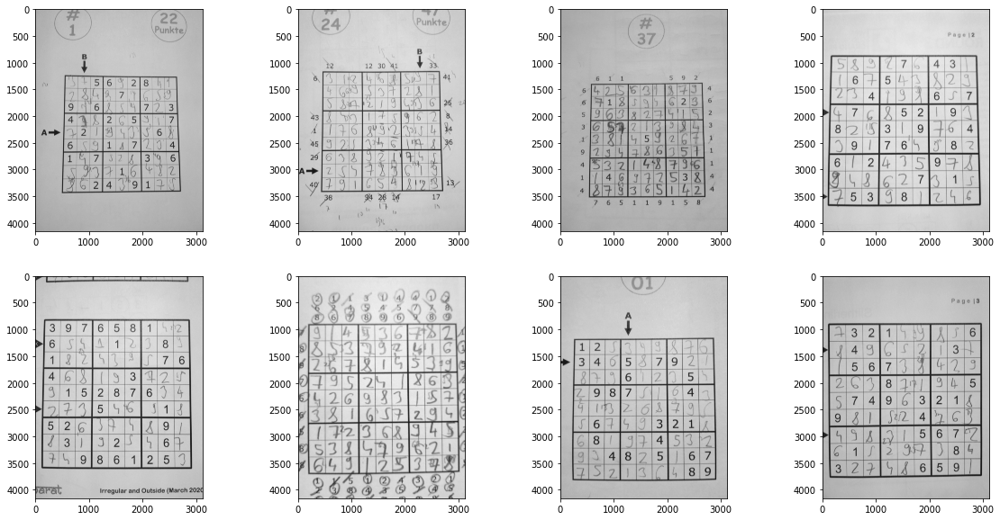

In [ ]:
plt.figure(figsize=(20, 10))
for idx, filename in enumerate(os.listdir(easy_pics_path)[:8]):
    plt.subplot(2, 4, idx + 1)
    filepath = os.path.join(easy_pics_path, filename)
    
    imgplot = plt.imshow(to_gray(filepath), cmap='gray')
plt.show()

In [ ]:
im = np.asarray(to_gray(os.path.join(easy_pics_path, 'E1.jpg')))
im

array([[140, 140, 140, ..., 146, 147, 148],
       [140, 140, 140, ..., 147, 148, 149],
       [140, 140, 140, ..., 148, 149, 149],
       ...,
       [127, 128, 129, ..., 132, 129, 127],
       [128, 130, 131, ..., 133, 130, 127],
       [130, 131, 132, ..., 133, 131, 128]], dtype=uint8)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi

from skimage import feature
edges1 = feature.canny(im)
edges2 = feature.canny(im, sigma=6)


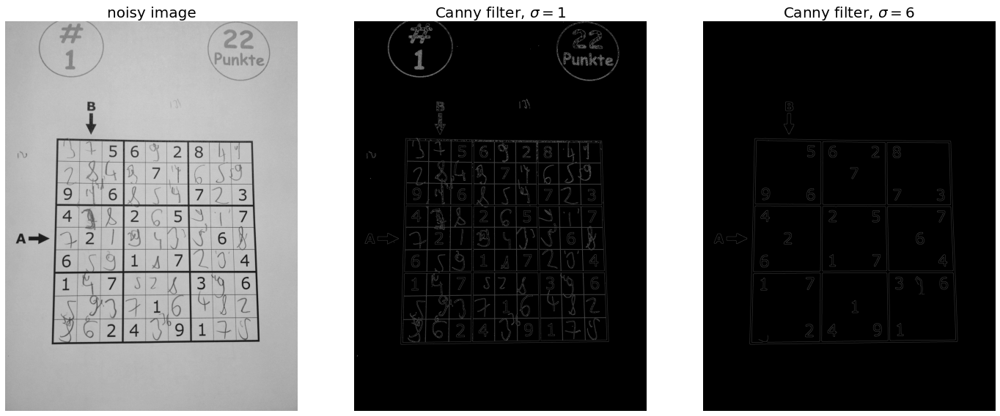

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(20, 8),
                                    sharex=True, sharey=True)

ax1.imshow(im, cmap=plt.cm.gray)
ax1.axis('off')
ax1.set_title('noisy image', fontsize=20)

ax2.imshow(edges1, cmap=plt.cm.gray)
ax2.axis('off')
ax2.set_title(r'Canny filter, $\sigma=1$', fontsize=20)

ax3.imshow(edges2, cmap=plt.cm.gray)
ax3.axis('off')
ax3.set_title(r'Canny filter, $\sigma=6$', fontsize=20)

fig.tight_layout()

plt.show()

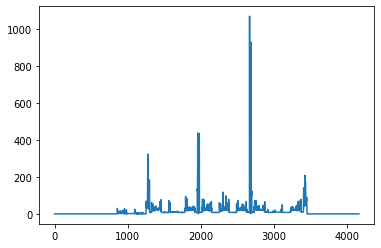

In [ ]:
horizontal = edges2.sum(axis=1)
plt.plot(horizontal)

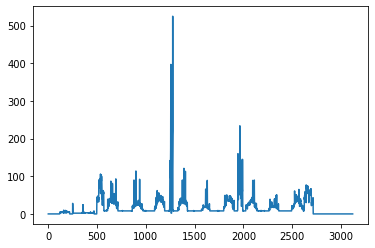

In [ ]:
vertical = edges2.sum(axis=0)
plt.plot(vertical)

In [ ]:
y = np.argsort(vertical)[-100:]
y_min, y_max = y.min(), y.max()
y_min, vertical[y_min], y_max, vertical[y_max]

(518, 86, 2660, 74)

In [ ]:
x = np.argsort(horizontal)[-100:]
x_min, x_max = x.min(), x.max()
x_min, horizontal[x_min], x_max, horizontal[x_max]

(1268, 73, 3446, 89)

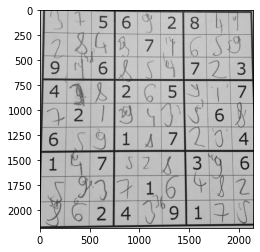

In [ ]:
plt.imshow(im[x_min:x_max, y_min:y_max], cmap='gray')

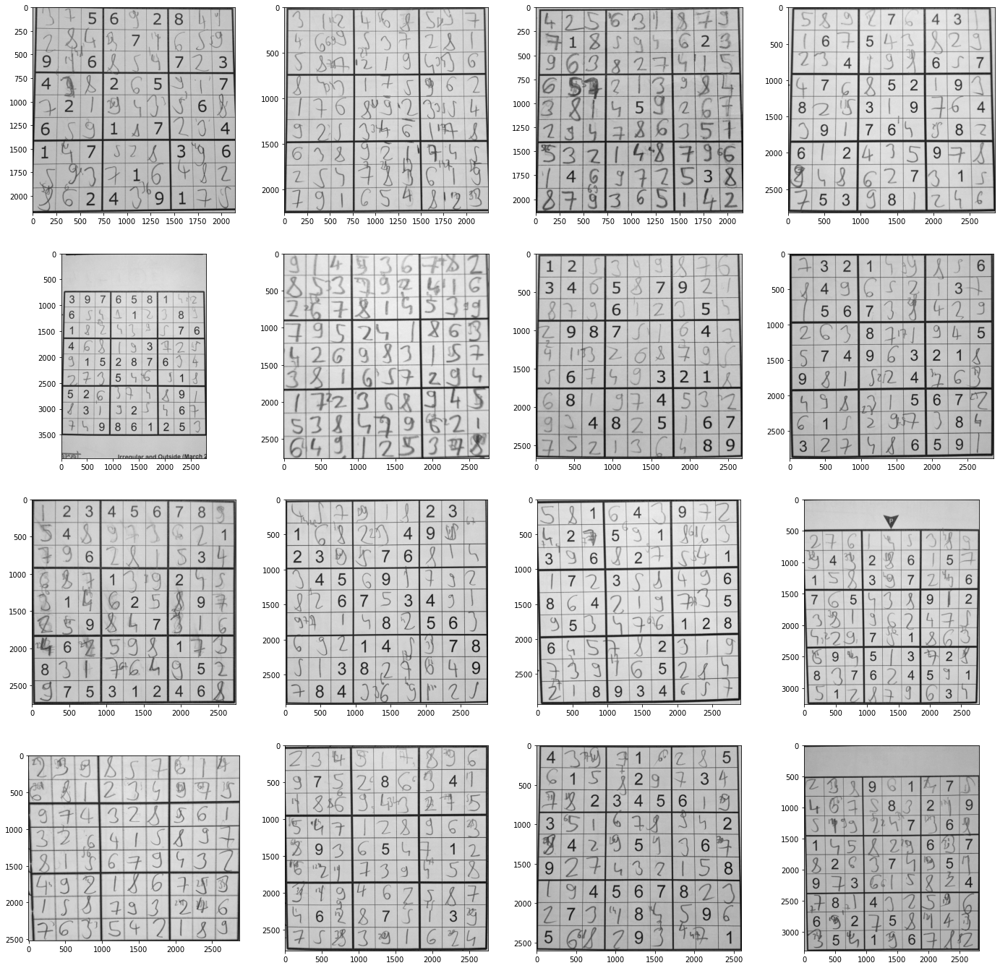

In [ ]:
S = 75
plt.figure(figsize=(24, 24))
for idx, filename in tqdm(enumerate(os.listdir(easy_pics_path)[:16])):
    plt.subplot(4, 4, idx + 1)
    filepath = os.path.join(easy_pics_path, filename)

    im = np.asarray(to_gray(filepath))
    edges = feature.canny(im, sigma=7)
    horizontal = edges.sum(axis=1)
    vertical = edges.sum(axis=0)
    y = np.argsort(vertical)[-S:]
    y_min, y_max = y.min(), y.max()
    x = np.argsort(horizontal)[-S:]
    x_min, x_max = x.min(), x.max()

    plt.imshow(im[x_min:x_max, y_min:y_max], cmap='gray')
plt.show()

A może detekcja narożników zamiast detekcji krawędzi diagramu?

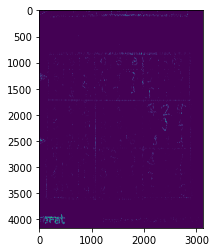

number of Hough lines: 51


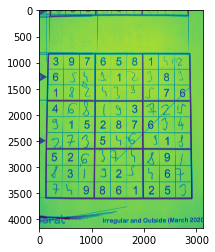

In [ ]:
import cv2
import numpy as np


filter = False


file_path = ''
img = gray_images[4]

# gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = gray_images[4]
edges = cv2.Canny(gray,90,150,apertureSize = 3)
kernel = np.ones((3,3),np.uint8)
edges = cv2.dilate(edges,kernel,iterations = 1)
kernel = np.ones((5,5),np.uint8)
edges = cv2.erode(edges,kernel,iterations = 1)

plt.imshow(edges)
plt.show()
# cv2.imwrite('canny.jpg',edges)

lines = cv2.HoughLines(edges,1,np.pi/180,150)

if not lines.any():
    print('No lines were found')
    # exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1

    # how many lines are similar to a given one
    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(len(lines)):
            if i == j:
                continue

            rho_i,theta_i = lines[i][0]
            rho_j,theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    # ordering the INDECES of the lines by how many are similar to them
    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x : len(similar_lines[x]))

    # line flags is the base for the filtering
    line_flags = len(lines)*[True]
    for i in range(len(lines) - 1):
        if not line_flags[indices[i]]: # if we already disregarded the ith element in the ordered list then we don't care (we will not delete anything based on it and we will never reconsider using this line again)
            continue

        for j in range(i + 1, len(lines)): # we are only considering those elements that had less similar line
            if not line_flags[indices[j]]: # and only if we have not disregarded them already
                continue

            rho_i,theta_i = lines[indices[i]][0]
            rho_j,theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[indices[j]] = False # if it is similar and have not been disregarded yet then drop it now

print('number of Hough lines:', len(lines))

filtered_lines = []

if filter:
    for i in range(len(lines)): # filtering
        if line_flags[i]:
            filtered_lines.append(lines[i])

    print('Number of filtered lines:', len(filtered_lines))
else:
    filtered_lines = lines

for line in filtered_lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv2.line(img,(x1,y1),(x2,y2),(0,0,255),2)

plt.imshow(img)
# cv2.imwrite('hough.jpg',img)

468 624 2652 3536 2912 2184
468 624 2652 3536 2912 2184
468 624 2652 3536 2912 2184



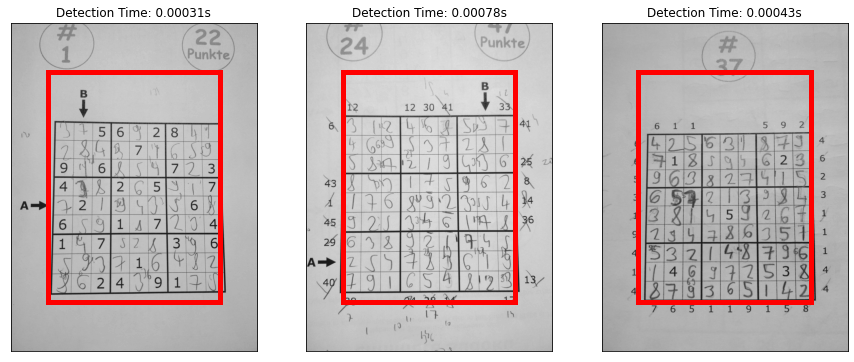

In [ ]:
class GridDetector:

    def __init__(self, image):
        self.image = image
        self.row, self.col = self.image.shape

        # coords is a tuple (x1, y1, x2, y2) representing the bounding
        # box of the detected grid
        self.coords = None

    def grid(self):
        '''Return a tuple (x1, y1, x2, y2) indicating the grid,
        where (x1, y1) is the upper left corner of the grid,
        and (x2, y2) is the lower right corner of the grid.

        All subclass should implement this method.'''
        if self.coords is not None:
            return self.coords
        x1 = int(self.col * 0.15)
        y1 = int(self.row * 0.15)
        x2 = int(self.col * 0.85)
        y2 = int(self.row * 0.85)
        self.coords = (x1, y1, x2, y2)
        return (x1, y1, x2, y2)

    def plot(self, plt):
        plt.imshow(self.image, cmap='gray')
        start = time.time()
        x1, y1, x2, y2 = self.grid()
        print(x1, y1, x2, y2, y2 - y1, x2 - x1)
        time_used = time.time() - start
        plt.plot([x1, x1], [y1, y2], 'r-', lw=5)
        plt.plot([x1, x2], [y2, y2], 'r-', lw=5)
        plt.plot([x2, x2], [y1, y2], 'r-', lw=5)
        plt.plot([x1, x2], [y1, y1], 'r-', lw=5)
        plt.xticks([])
        plt.yticks([])
        plt.title(f'Detection Time: {time_used:.2}s')

def check(DetectorClass, images):
    n = len(images)
    plt.figure(figsize=(15, 30))
    for i, image in tqdm(list(enumerate(images))):
        plt.subplot(1, n, i+1)
        DetectorClass(image).plot(plt)
    plt.show()

check(GridDetector, list(gray_images[:3]))

Załóżmy, że ramka jest największym elementem na zdjęciu - zróbmy BFSa po czarnych i znajdźmy granice diagramu

$Threshold$ odpowiada za granicę, poniżej uznajemy pixel za czarny.

Nie mam gwarancji, że zafiksowany jest ok. Pomysł: iterować po wartościach, na koniec głosując wybrać najlepszy.

To chwilę zajmie, dlatego wartoby jakiś downsampling zrobić.

Do tego można jeszcze jakąś heurę na kwadratowość zrobić

283 1092 2905 3697 2605 2622
176 921 2931 3701 2780 2755
123 887 2960 3758 2871 2837
66 713 3009 3591 2878 2943
56 770 3057 3739 2969 3001



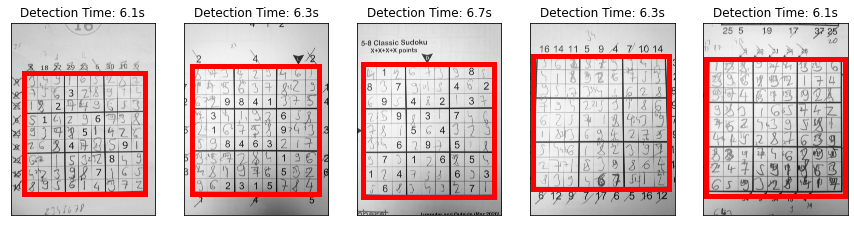

In [ ]:
class LargestComponent(GridDetector):

    threshold = 60

    def grid(self):
        if self.coords is not None:
            return self.coords
        visited = set()
        for i in range(self.row):
            for j in range(self.col):
                if (i, j) in visited or self.image.item(i, j) >= self.threshold:
                    continue
                x1, y1, x2, y2 = self._flood_fill(i, j, visited)
                if self.coords is None:
                    self.coords = (x1, y1, x2, y2)
                else:
                    a1, b1, a2, b2 = self.coords
                    if (x2 - x1) * (y2 - y1) > (a2 - a1) * (b2 - b1):
                        self.coords = (x1, y1, x2, y2)

        return self.coords

    def _flood_fill(self, i, j, visited):
        r1 = r2 = i
        c1 = c2 = j
        stack = [(i, j)]
        visited.add((i, j))
        while stack:
            r, c = stack.pop()
            for nr, nc in [(r+1, c), (r-1, c), (r, c+1), (r, c-1)]:
                if nr < 0 or nc < 0 or nr >= self.row or nc >= self.col:
                    continue
                if (nr, nc) in visited or self.image.item(nr, nc) >= self.threshold:
                    continue
                r1 = min(nr, r1)
                r2 = max(nr, r2)
                c1 = min(nc, c1)
                c2 = max(nc, c2)
                stack.append((nr, nc))
                visited.add((nr, nc))
            
        return (c1, r1, c2, r2)

check(LargestComponent, gray_images[35:40])

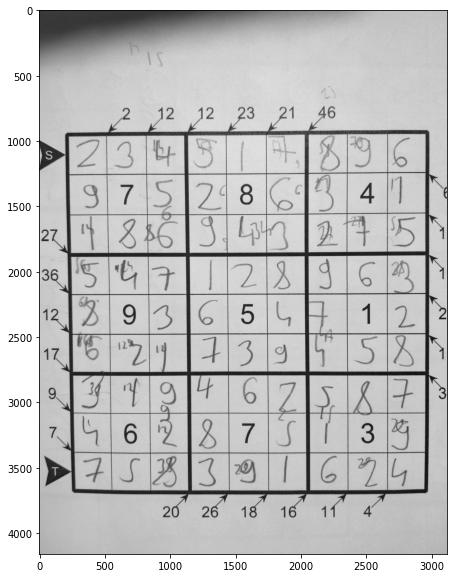

In [ ]:
plt.figure(figsize=(20, 10))
plt.imshow(gray_images[13], cmap='gray')

## This works

In [ ]:
def check(detector_constructor, images):
    n = len(images)
    plt.figure(figsize=(15, 30))
    for i, image in tqdm(list(enumerate(images))):
        plt.subplot(1, n, i+1)
        detector_constructor(image).plot(plt)
    plt.show()

In [ ]:
def order_points(pts):
	# initialzie a list of coordinates that will be ordered
	# such that the first entry in the list is the top-left,
	# the second entry is the top-right, the third is the
	# bottom-right, and the fourth is the bottom-left
	rect = np.zeros((4, 2), dtype = "float32")

	# the top-left point will have the smallest sum, whereas
	# the bottom-right point will have the largest sum
	s = pts.sum(axis = 1)
	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]

	# now, compute the difference between the points, the
	# top-right point will have the smallest difference,
	# whereas the bottom-left will have the largest difference
	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]

	# return the ordered coordinates
	return rect

def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect

	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))

	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))

	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")

	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

	# return the warped image
	return warped

In [ ]:
import numpy as np
from skimage import io
from skimage.transform import rotate
from skimage.color import rgb2gray
from glob import glob
from skimage.filters import threshold_local
import numpy as np
import argparse
import cv2
import imutils

class Deskewing:

    def __init__(self, image, block_size = 81, offset = 10):
        self.image = image
        # coords is a tuple (x1, y1, x2, y2) representing the bounding
        # box of the detected grid
        self.coords = None

        self.block_size = block_size
        self.offset = offset

    
        

    def plot(self, plt):
        start = time.time()
        plt.imshow(self._deskew(), cmap='gray')
        time_used = time.time() - start

        plt.title(f'Detection Time: {time_used:.2}s')

    def _deskew(self):
        image = self.image
        ratio = image.shape[0] / 500.0
        orig = image.copy()
        image = imutils.resize(image, height = 500)

        # convert the image to grayscale, blur it, and find edges
        # in the image
        gray = image
        gray = cv2.GaussianBlur(gray, (5, 5), 0)
        edged = cv2.Canny(gray, 75, 200)



        # find the contours in the edged image, keeping only the
        # largest ones, and initialize the screen contour
        cnts = cv2.findContours(edged.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:10]

        # loop over the contours
        approx = []
        screenCnt = None

        # print('=')
        for c in cnts:
            # print(c.shape, cv2.contourArea(c))
            # approximate the contour
            peri = cv2.arcLength(c, True)
            approx.append(cv2.approxPolyDP(c, 0.02 * peri, True))

            # if our approximated contour has four points, then we
            # can assume that we have found our screen
            # print(approx[-1])
            if screenCnt is None and len(approx[-1]) == 4:
                screenCnt = approx[-1]
                
        # print(screenCnt)
        cv2.drawContours(image, [screenCnt], -1, (0, 255, 0), 2)

        # apply the four point transform to obtain a top-down
        # view of the original image
        warped = four_point_transform(orig, screenCnt.reshape(4, 2) * ratio)

        # convert the warped image to grayscale, then threshold it
        # to give it that 'black and white' paper effect
        # warped = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
        T = threshold_local(warped, self.block_size, offset = self.offset, method = "gaussian")
        warped = (warped > T).astype("uint8") * 255
        return warped.astype("uint8")


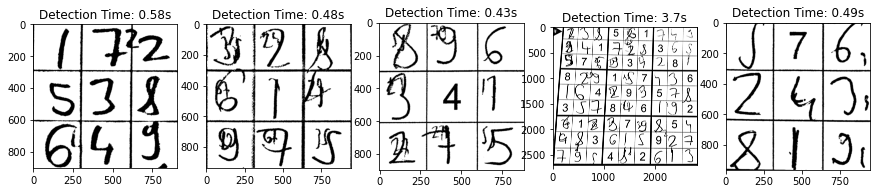

In [ ]:
# for i in tqdm(range(0, bad, 5)):
bad = [5, 12, 13, 21, 26, 32, 39, 41, 48, 51]

check(lambda image: Deskewing(image, block_size=231, offset=15), gray_images[bad[:5]])

## Cutting off the grid

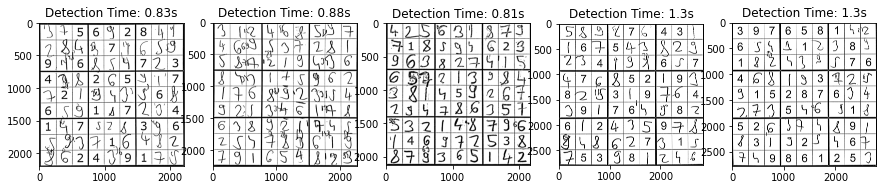

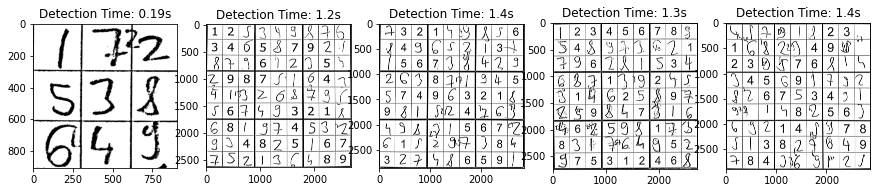

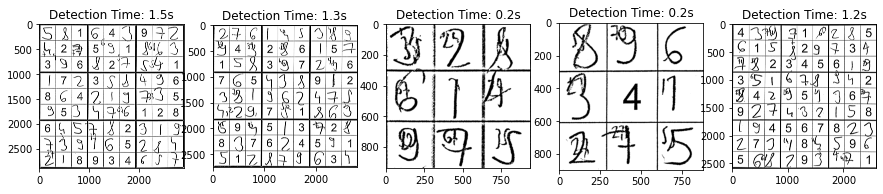

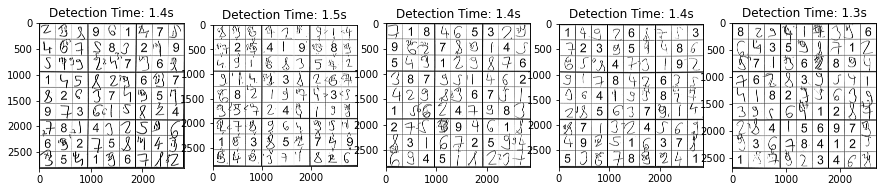

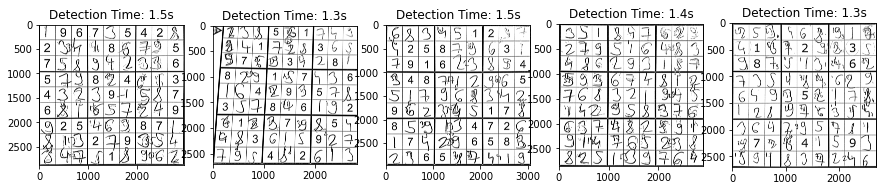

...

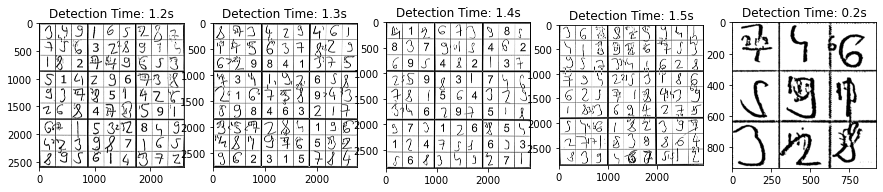

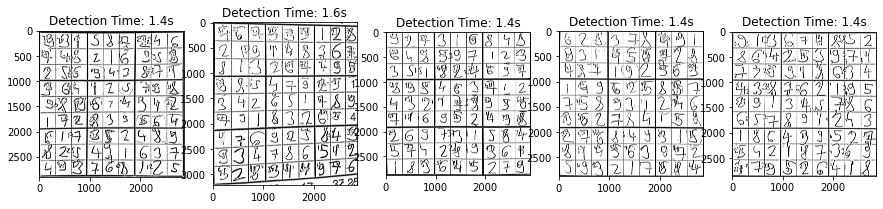

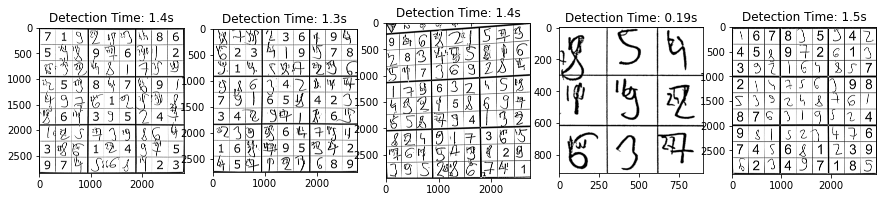

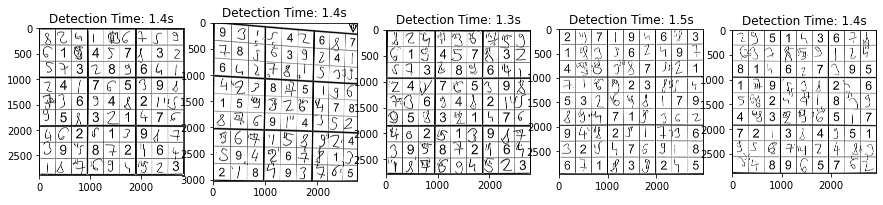

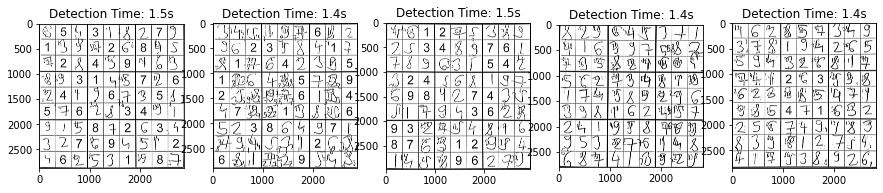

In [ ]:
for i in tqdm(range(0, len(gray_images), 5)):
    check(Deskewing, gray_images[i:i+5])

## ...

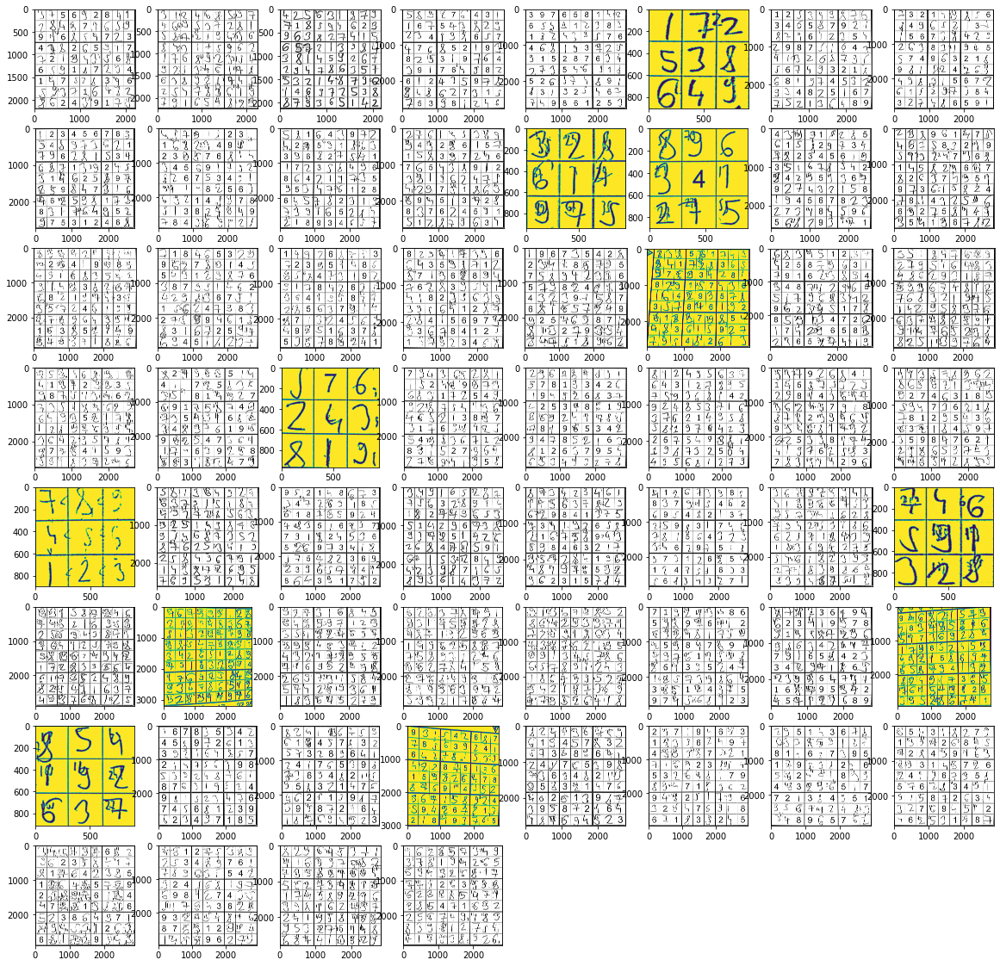

In [ ]:
deskewed_imgs = []
plt.figure(figsize=(20, 20))
for i in tqdm(range(len(gray_images))):
    deskewed = Deskewing(gray_images[i])._deskew()
    plt.subplot(8, 8, i + 1)
    if deskewed.shape[0] < 2000 or deskewed.shape[1] < 2000 or abs(deskewed.shape[0] - deskewed.shape[1]) > 100:
        plt.imshow(deskewed)
    else:
        plt.imshow(deskewed, cmap='gray')
        
    deskewed_imgs.append(deskewed)

In [ ]:
def deskew_verify(img):
    x, y = img.shape
    if x < 2000 or y < 2000 or abs(x - y) > 100:
        return False
    return True

In [ ]:
correct = []
for i in tqdm(range(len(deskewed_imgs))):
    if deskew_verify(deskewed_imgs[i]):
        correct.append(i)

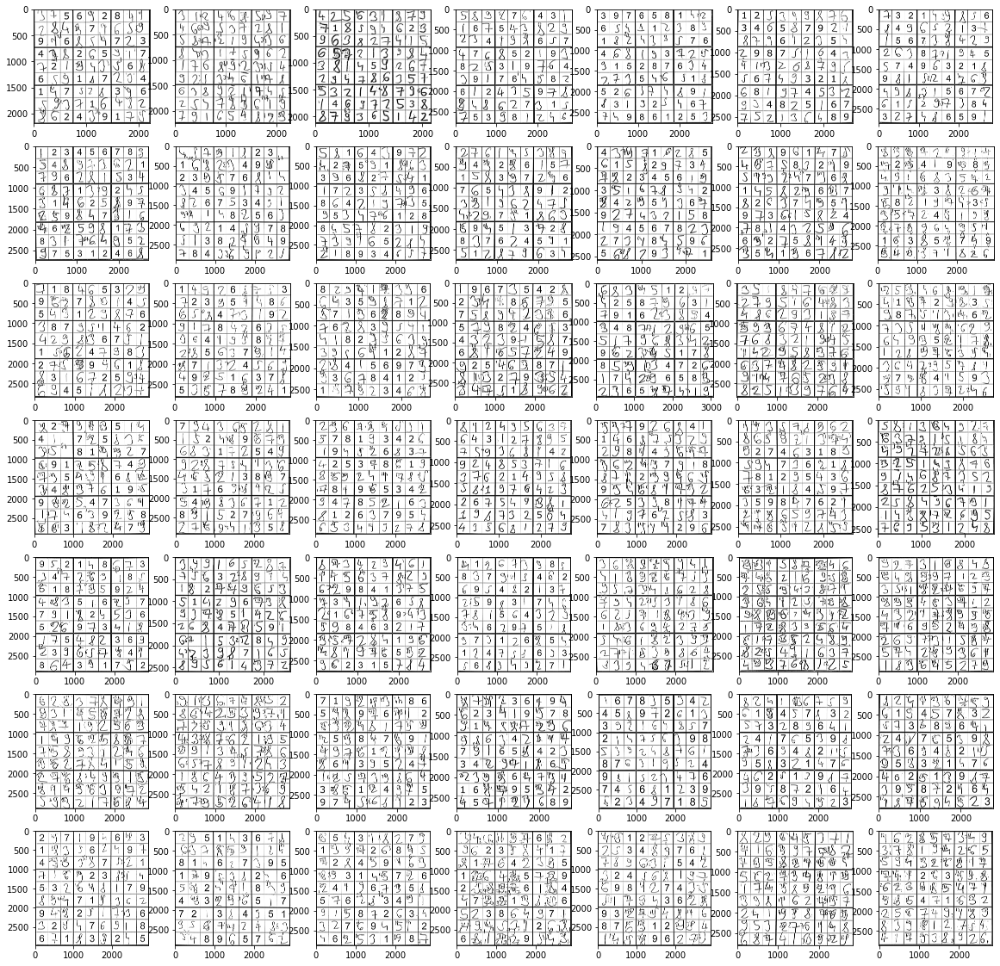

In [ ]:
plt.figure(figsize=(20, 20))
for i in tqdm(range(len(correct))):
    plt.subplot(7, 7, i + 1)
    plt.imshow(deskewed_imgs[correct[i]], cmap='gray')

In [ ]:
def split_into_cells(cropped, border_size=3):
    width, height = cropped.shape
    digit_width, digit_height = width // 9, height // 9
    digits = np.zeros((81, 28, 28))

    ln_space = np.linspace(0, digit_width - 1, 28).astype(int)
    xv, yv = np.meshgrid(ln_space, ln_space)

    for i, (idx, jdx) in enumerate(itertools.product(range(9), range(9))):
        big_num = cropped[digit_width * idx : digit_width * (idx + 1), 
                                  digit_height * jdx : digit_height * (jdx + 1)]

        digits[i, :, :] = big_num[yv, xv]
        # cutting off the border
        border_size = 21 // 7
        pix_sum = 0.4
        for j in range(border_size):
            if digits[i, j, :].sum() < (digit_width * 255) * pix_sum :
                digits[i, j, :] = 255

            if digits[i, :, j].sum() < (digit_width * 255) * pix_sum:
                digits[i, :, j] = 255

            if digits[i, -j, :].sum() < (digit_width * 255) * pix_sum:
                digits[i, -j, :] = 255

            if digits[i, :, -j].sum() < (digit_width * 255) * pix_sum:
                digits[i, :, -j] = 255
                
    return digits

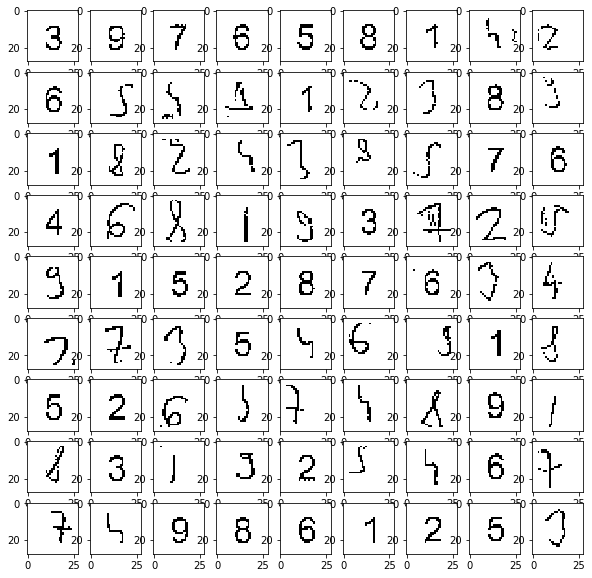

In [ ]:
digits = split_into_cells(deskewed_imgs[4])
plt.figure(figsize=(10,10))
for i in range(81):
    plt.subplot(9, 9, i + 1)
    plt.imshow(digits[i, :, :], cmap='gray', interpolation='none')

## Splitting into single digits

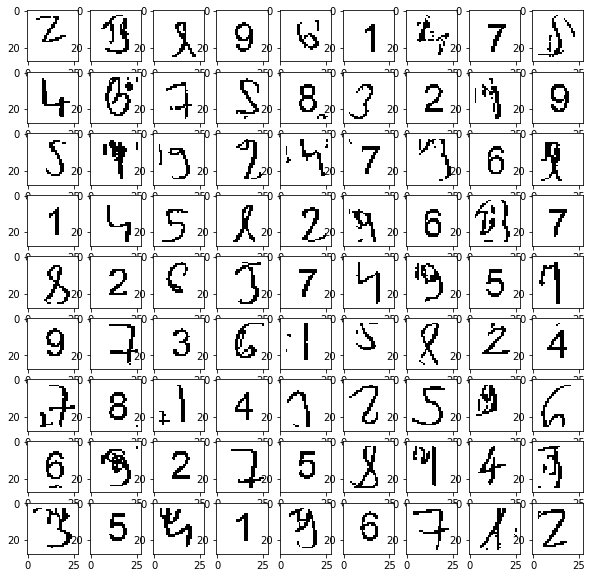

In [ ]:
plt.figure(figsize=(10,10))
for i in range(81):
    plt.subplot(9, 9, i + 1)
    plt.imshow(digits[i, :, :], cmap='gray', interpolation='none')

In [ ]:
y = np.array([ 
    [2,3,8,9,6,1,4,7,5], 
    [4,6,7,5,8,3,2,1,9], 
    [5,1,9,2,4,7,3,6,8], 
    [1,4,5,8,2,9,6,3,7], 
    [8,2,6,3,7,4,9,5,1],
    [9,7,3,6,1,5,8,2,4],
    [7,8,1,4,3,2,5,9,6], 
    [6,9,2,7,5,8,1,4,3], 
    [3,5,4,1,9,6,7,8,2] ])

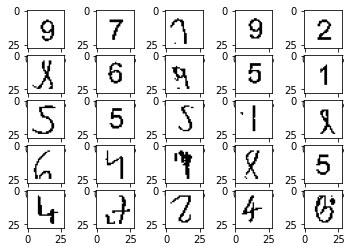

In [ ]:
for i, idx in enumerate(np.random.choice(range(81), 25, replace=False)):
    plt.subplot(5, 5, i + 1)
    plt.imshow(digits[idx, :, :], cmap='gray')

## Check sudoku corectness


In [ ]:
sudoku = np.array(
    [
        [1, 4, 5,   3, 2, 7,   6, 9, 8],
        [8, 3, 9,   6, 5, 4,   1, 2, 7],
        [6, 7, 2,   9, 1, 8,   5, 4, 3],
     
        [4, 9, 6,   1, 8, 5,   3, 7, 2],
        [2, 1, 8,   4, 7, 3,   9, 5, 6],
        [7, 5, 3,   2, 9, 6,   4, 8, 1],
     
        [3, 6, 7,   5, 4, 2,   8, 1, 9],
        [9, 8, 4,   7, 6, 1,   2, 3, 5],
        [5, 2, 1,   8, 3, 9,   7, 6, 4],
    ]
)
sudoku2 = np.array(
    [
        [1, 4, 5,   3, 2, 7,   6, 9, 7],
        [8, 3, 9,   6, 5, 4,   1, 2, 8],
        [6, 7, 2,   9, 1, 8,   5, 4, 3],
     
        [4, 9, 6,   1, 8, 5,   3, 7, 2],
        [2, 1, 8,   4, 7, 3,   9, 5, 6],
        [7, 5, 3,   2, 9, 6,   4, 8, 1],
     
        [3, 6, 7,   5, 4, 2,   8, 1, 9],
        [9, 8, 4,   7, 6, 1,   2, 3, 5],
        [5, 2, 1,   8, 3, 9,   7, 6, 4],
    ]
)


def check_sudoku(sudoku):
    ln_sp = np.arange(1, 10)
    xx, yy = np.meshgrid(ln_sp, ln_sp)
    tmp_arr = np.zeros((9, 9))
    for i in range(3):
        for j in range(3):
            tmp_arr[3*i + j] = sudoku[3*i:3*i+3, 3*j:3*j+3].ravel()
    return (
        np.all(np.sort(tmp_arr, axis=1) == xx)
        and np.all(np.sort(sudoku, axis=1) == xx) 
        and np.all(np.sort(sudoku, axis=0) == yy)
        )
    
check_sudoku(sudoku)

True

## Example NN
[PyTorch MNIST](https://github.com/pytorch/examples/blob/master/mnist/main.py)

In [ ]:
import torch
import torchvision


n_epochs = 3
batch_size_train = 64
batch_size_test = 1000
learning_rate = 0.01
momentum = 0.5
log_interval = 10

random_seed = 1
torch.backends.cudnn.enabled = False
torch.manual_seed(random_seed)

train_loader = torch.utils.data.DataLoader(
  torchvision.datasets.MNIST('/files/', train=True, download=True,
                             transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize(
                                 (0.1307,), (0.3081,))
                             ])),
  batch_size=batch_size_train, shuffle=True)

test_loader = torch.utils.data.DataLoader(
  torchvision.datasets.MNIST('/files/', train=False, download=True,
                             transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize(
                                 (0.1307,), (0.3081,))
                             ])),
  batch_size=batch_size_test, shuffle=True)

sudoku_loader = torch.utils_data.DataLoader(
    
)

Extracting /files/MNIST/raw/train-images-idx3-ubyte.gz to /files/MNIST/raw


Extracting /files/MNIST/raw/train-labels-idx1-ubyte.gz to /files/MNIST/raw


Extracting /files/MNIST/raw/t10k-images-idx3-ubyte.gz to /files/MNIST/raw


Extracting /files/MNIST/raw/t10k-labels-idx1-ubyte.gz to /files/MNIST/raw
Processing...



Done!


/pytorch/torch/csrc/utils/tensor_numpy.cpp:141: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program.


In [ ]:
examples = enumerate(test_loader)
batch_idx, (example_data, example_targets) = next(examples)
example_data.shape

torch.Size([1000, 1, 28, 28])

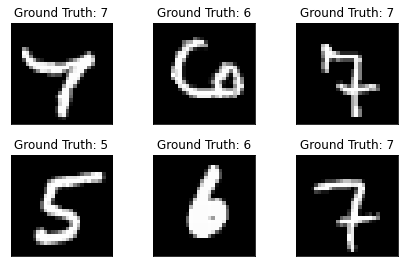

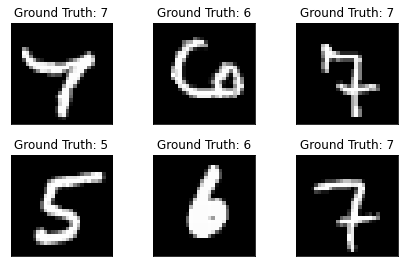

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(example_targets[i]))
  plt.xticks([])
  plt.yticks([])
fig

In [ ]:
tensor_x = torch.Tensor((255 - digits).reshape((-1, 1, 28, 28)))
tensor_y = torch.LongTensor(y.reshape((-1)))
grid_dataset = torch.utils.data.TensorDataset(tensor_x,tensor_y) 
grid_dataloader = torch.utils.data.DataLoader(grid_dataset, batch_size=batch_size_test, shuffle=True)  

array([[2, 3, 8, 9, 6, 1, 4, 7, 5],
       [4, 6, 7, 5, 8, 3, 2, 1, 9],
       [5, 1, 9, 2, 4, 7, 3, 6, 8],
       [1, 4, 5, 8, 2, 9, 6, 3, 7],
       [8, 2, 6, 3, 7, 4, 9, 5, 1],
       [9, 7, 3, 6, 1, 3, 8, 2, 4],
       [7, 8, 1, 4, 3, 2, 5, 9, 6],
       [6, 9, 2, 7, 5, 8, 1, 4, 3],
       [3, 5, 4, 1, 9, 6, 7, 8, 2]])

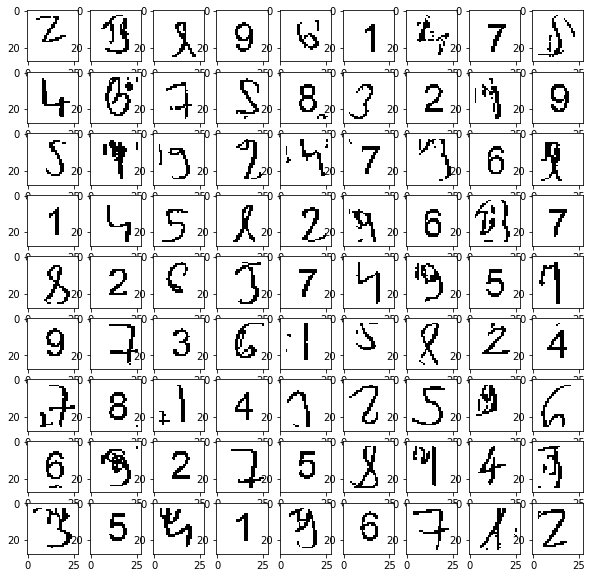

In [ ]:
plt.figure(figsize=(10,10))
for i in range(81):
    plt.subplot(9, 9, i + 1)
    plt.imshow(digits[i, :, :], cmap='gray', interpolation='none')
y

In [ ]:
examples = enumerate(grid_dataloader)
batch_idx, (example_data, example_targets) = next(examples)
example_data.shape

torch.Size([81, 1, 28, 28])

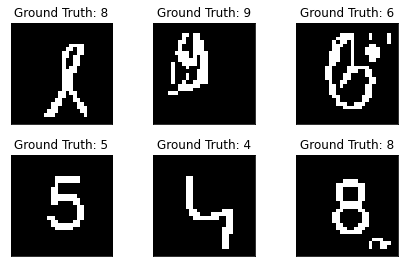

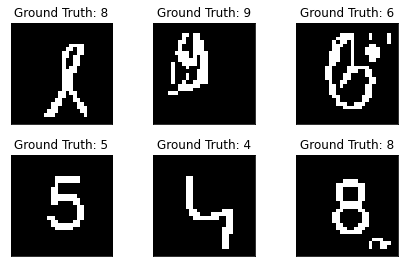

In [ ]:
fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(example_targets[i]))
  plt.xticks([])
  plt.yticks([])
fig

In [ ]:
a = torchvision.datasets.MNIST('/files/', train=False, download=True,
                             transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize(0, 1)
                             ]))
a

Dataset MNIST
    Number of datapoints: 10000
    Root location: /files/
    Split: Test
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=0, std=1)
           )

In [ ]:
np.unique(a[0][0][0])

array([0.        , 0.00392157, 0.01176471, 0.01960784, 0.03529412,
       0.05490196, 0.06666667, 0.07058824, 0.07450981, 0.08235294,
       0.08627451, 0.12156863, 0.13725491, 0.14117648, 0.14901961,
       0.15686275, 0.17254902, 0.20392157, 0.22352941, 0.22745098,
       0.23137255, 0.23529412, 0.23921569, 0.24313726, 0.25882354,
       0.2627451 , 0.28235295, 0.29411766, 0.3019608 , 0.3254902 ,
       0.32941177, 0.41568628, 0.44705883, 0.4509804 , 0.4745098 ,
       0.49411765, 0.5058824 , 0.52156866, 0.54901963, 0.5921569 ,
       0.62352943, 0.6392157 , 0.6509804 , 0.6666667 , 0.7137255 ,
       0.7254902 , 0.73333335, 0.7764706 , 0.79607844, 0.8039216 ,
       0.8117647 , 0.81960785, 0.85882354, 0.8666667 , 0.87058824,
       0.8784314 , 0.88235295, 0.8901961 , 0.8980392 , 0.9137255 ,
       0.9254902 , 0.93333334, 0.9411765 , 0.94509804, 0.9490196 ,
       0.972549  , 0.9764706 , 0.98039216, 0.9843137 , 0.99215686,
       0.99607843, 1.        ], dtype=float32)

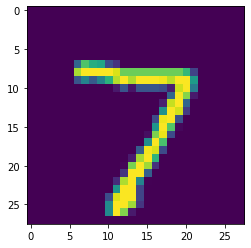

In [ ]:
plt.imshow(a[0][0][0])

In [ ]:
import torch.nn.functional as F
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, 1)
        self.conv2 = nn.Conv2d(32, 64, 3, 1)
        self.dropout1 = nn.Dropout2d(0.25)
        self.dropout2 = nn.Dropout2d(0.5)
        self.fc1 = nn.Linear(9216, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu(x)
        x = self.conv2(x)
        x = F.relu(x)
        x = F.max_pool2d(x, 2)
        x = self.dropout1(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = F.relu(x)
        x = self.dropout2(x)
        x = self.fc2(x)
        output = F.log_softmax(x, dim=1)
        return output


def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            # print(pred.reshape((9,9)))
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return pred.numpy()

# torch.utils.data.DataLoader(

In [ ]:
model = Net()

In [ ]:
train(model=model, device='cpu', train_loader=train_loader, epoch=30, optimizer=torch.optim.Adam(model.parameters()))

Train Epoch: 30 [0/60000 (0%)]	Loss: 2.292349
Train Epoch: 30 [6400/60000 (11%)]	Loss: 0.340384
Train Epoch: 30 [12800/60000 (21%)]	Loss: 0.327970
Train Epoch: 30 [19200/60000 (32%)]	Loss: 0.127610
Train Epoch: 30 [25600/60000 (43%)]	Loss: 0.073101
Train Epoch: 30 [32000/60000 (53%)]	Loss: 0.046204
Train Epoch: 30 [38400/60000 (64%)]	Loss: 0.123202
Train Epoch: 30 [44800/60000 (75%)]	Loss: 0.049112
Train Epoch: 30 [51200/60000 (85%)]	Loss: 0.087665
Train Epoch: 30 [57600/60000 (96%)]	Loss: 0.134980


In [ ]:
test(model=model, device='cpu', test_loader=test_loader)


Test set: Average loss: 0.0461, Accuracy: 9837/10000 (98%)



In [ ]:
## Sample 

## Sample prediction

In [ ]:
prediction = test(model=model, device='cpu', test_loader=grid_dataloader)
equal = prediction.reshape((9,9)) == y 
print(equal, equal.sum())


Test set: Average loss: 107.7965, Accuracy: 50/81 (62%)

[[False False False False False False False False False]
 [False False False False False False False False False]
 [False False False  True False False False False False]
 [False False False False False False False False False]
 [False False False False False False False False  True]
 [False False False False False False False False False]
 [False False False False False False False False False]
 [False False  True False False False False False False]
 [False False  True  True False False False False False]] 5


<!-- ## Solving

### We have to train a net!

* Prepare grids of size 6x6, 9x9 for training dataset

### Present how the net guesses next digits for the grid -->
